# <font style = "color:rgb(50,120,229)"> Coin Detection </font>

So far we have studied about various mophological operations and different thresholding techniques in some detail. Now it's time to apply these concepts for a practical application - **Coin Detection**.

## <font style = "color:rgb(50,120,229)"> Aim </font>

In this assignment, you will work with 2 different images (so 2 different parts) and will use **only** morphological operations and thresholding techniques to detect the total number of coins present in the image. Your submission will be graded based on your use of the concepts covered in this module, experimentation performed to achieve at your final solution, documentation, and finally, the total number of coins successfully detected in the images. Each part will be of 15 marks. This assignment will be entirely **manually graded** so make sure that you do NOT remove any experimentation you have done as well as the observation you made after each step.

**Proper documentation for each step should be provided with help of markdown**

## <font style = "color:rgb(50,120,229)">Outline</font>

The main steps that you can follow to solve this assignment are:

1. Read the image.
2. Convert it to grayscale and split the image into the 3 (Red, Green and Blue) channels. Decide which of the above 4 images you want to use in further steps and provide reason for the same.
3. Use thresholding and/or morphological operations to arrive at a final binary image.
4. Use **simple blob detector** to count the number of coins present in the image.
5. Use **contour detection** to count the number of coins present in the image.
6. Use **CCA** to count the number of coins present in the image.

**We have also provided the results we obtained at the intermediate steps for your reference.**

# <font style = "color:rgb(50,120,229)">Assignment Part - A</font>

## <font style = "color:rgb(50,120,229)"> Step 1: Read Image</font>

In [1]:
import cv2
import matplotlib.pyplot as plt
from dataPath import DATA_PATH
import numpy as np
%matplotlib inline

In [2]:
import matplotlib
matplotlib.rcParams['figure.figsize'] = (10.0, 10.0)
matplotlib.rcParams['image.cmap'] = 'gray'

Text(0.5,1,'Original Image')

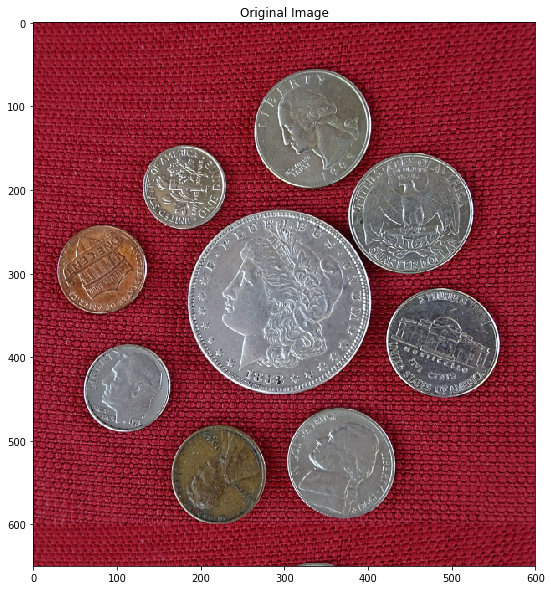

In [3]:
# Image path
imagePath = DATA_PATH + "images/CoinsA.png"
# Read image
# Store it in the variable image
###
### YOUR CODE HERE
###
image = cv2.imread(imagePath)
imageCopy = image.copy()
plt.imshow(image[:,:,::-1]);
plt.title("Original Image")

## <font style = "color:rgb(50,120,229)">Step 2.1: Convert Image to Grayscale</font>

In [4]:
# Convert image to grayscale
# Store it in the variable imageGray
###
### YOUR CODE HERE
###
imageGray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

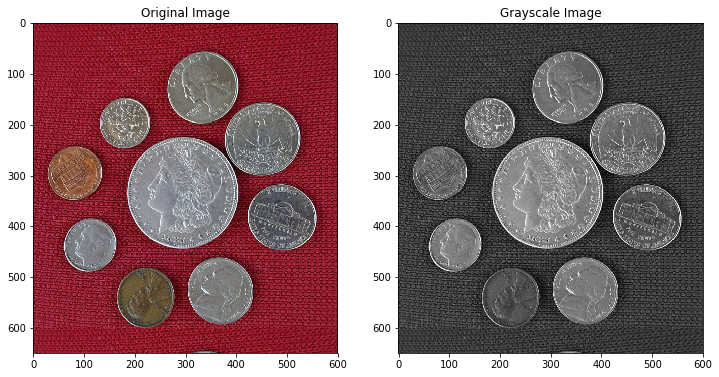

In [5]:
plt.figure(figsize=(12,12))
plt.subplot(121)
plt.imshow(image[:,:,::-1]);
plt.title("Original Image")
plt.subplot(122)
plt.imshow(imageGray);
plt.title("Grayscale Image");

## <font style = "color:rgb(50,120,229)">Step 2.2: Split Image into R,G,B Channels</font>

In [6]:
# Split cell into channels
# Store them in variables imageB, imageG, imageR
###
### YOUR CODE HERE
###
imageB,imageG,imageR = cv2.split(image)

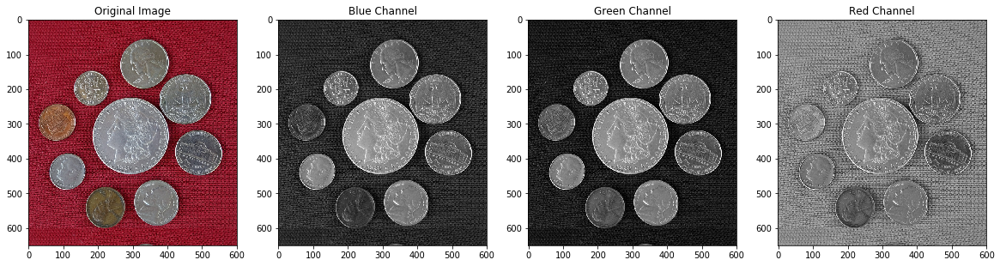

In [7]:
plt.figure(figsize=(20,12))
plt.subplot(141)
plt.imshow(image[:,:,::-1]);
plt.title("Original Image")
plt.subplot(142)
plt.imshow(imageB);
plt.title("Blue Channel")
plt.subplot(143)
plt.imshow(imageG);
plt.title("Green Channel")
plt.subplot(144)
plt.imshow(imageR);
plt.title("Red Channel");

## <font style = "color:rgb(50,120,229)">Step 3.1: Perform Thresholding</font>

You will have to carry out this step with different threshold values to see which one suits you the most. Do not remove those intermediate images and make sure to document your findings.

__Procedure__: The approach to select the optimal threshold limit is taken from the way we tune parameters in Grid search CV. Here I will start with an initial set of parameters for threshold on the split images from red,blue and green channel and also the grayscaled image 

__Attempt 1__:- Started with 10,20,30,40 threshold values. Observed that the green channel with threshold values of 20 showed satisfactory performance. (My definition of satisfactory performance is attaining the threshold image as shown in the video)

__Attempt 2__:- We will ignore values of 30 onwards because I just need to see how to get a near to close threshold image in the video lecture shown and I know it has to be somewhere between 10-30(or more precisely 15-30) for the Green channel. 

__Attempt 3__:- We only consider values from 20 to 29 and see what we want to chose. I settled with value of threshold being 25 only. We can see that the green channel threshold 20 image is like the image we need from video. Also we see that as we increase the threshold, we can see improvements in blue channel. We can experiment with that but for the time being I will settle with the parameters attained at end of this attempt. 

__Parameter to use__ : 

Threshold :- 20 

Image :- imageG (the green channel image) 

Max value :- 255 

Threshold Type :- Inverse Binary

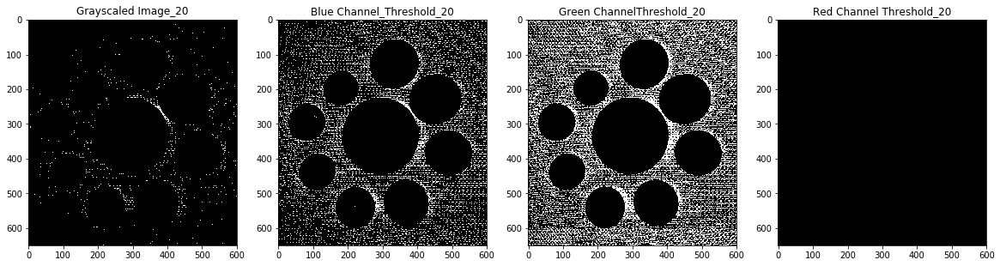

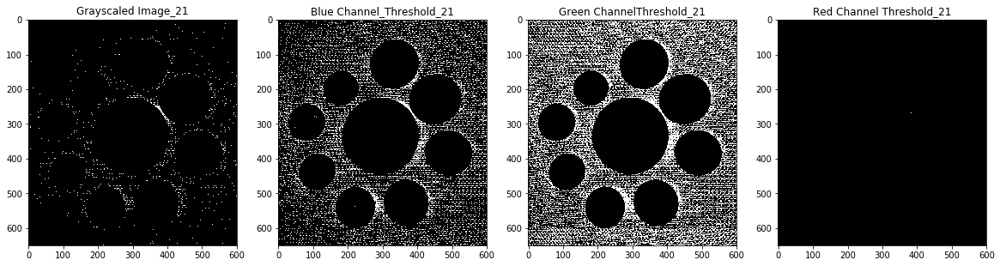

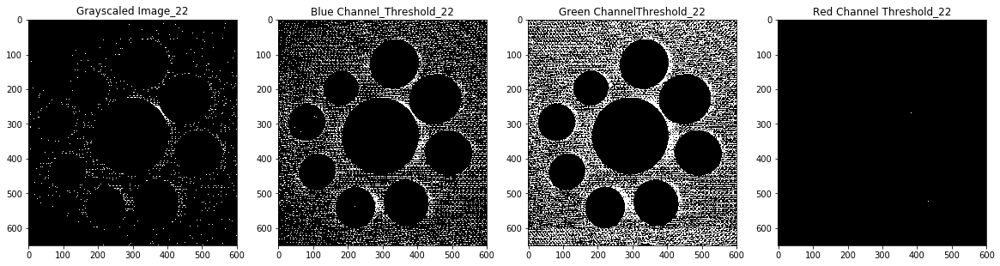

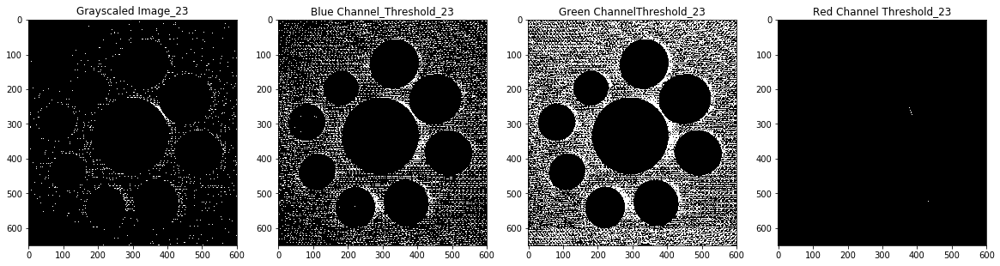

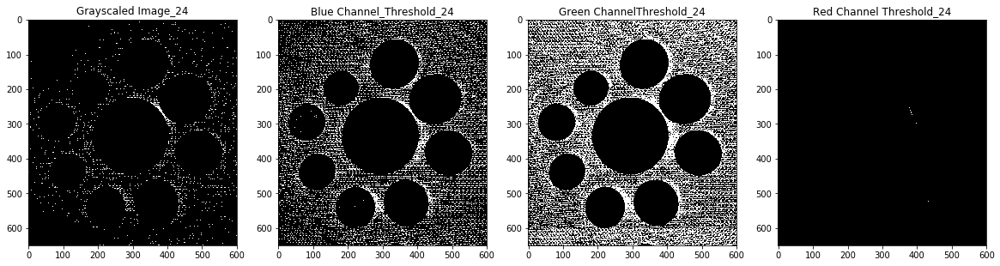

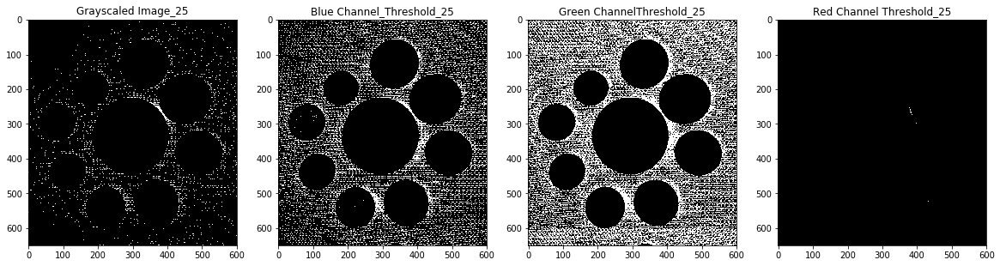

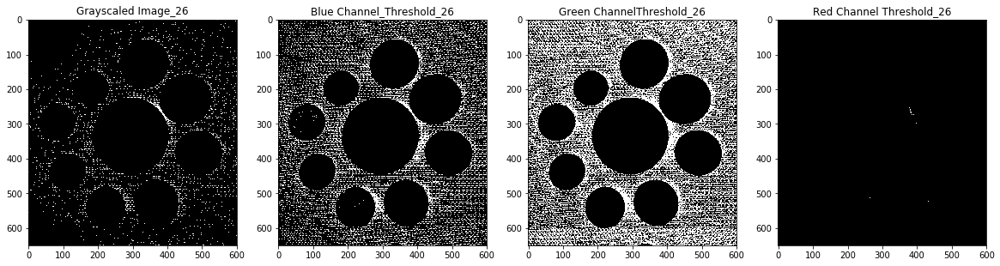

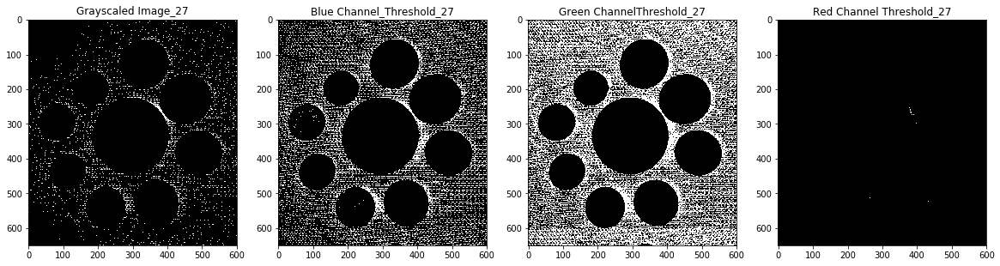

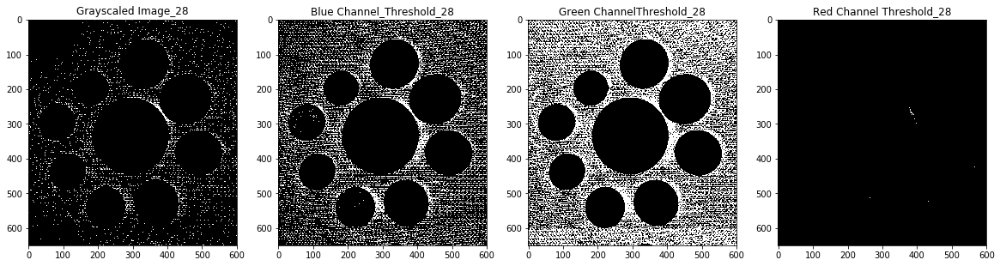

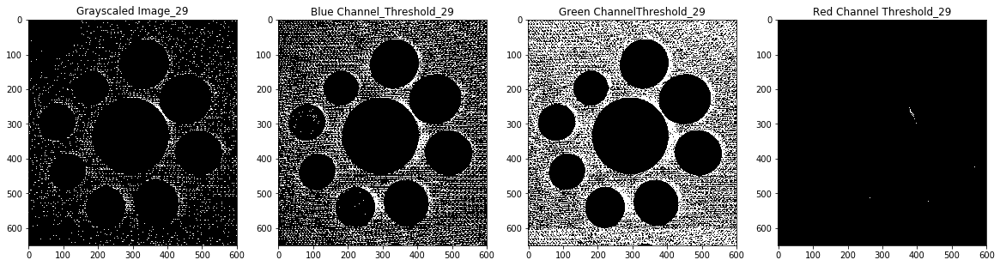

In [8]:
###
### YOUR CODE HERE
###
threshold_parameter_grid_attempt1 = [10,20,30,40]
threshold_parameter_grid_attempt2 = [10,15,20,25]
threshold_parameter_grid_attempt3 = [20,21,22,23,24,25,26,27,28,29]

threshold_parameter_grid  = threshold_parameter_grid_attempt3
for i in range(len(threshold_parameter_grid)):
    threshold    = threshold_parameter_grid[i]
    maxvalue     = 255
    _,thresh_image_red   = cv2.threshold(src = imageR,thresh = threshold,maxval=maxvalue,type = cv2.THRESH_BINARY_INV)
    _,thresh_image_green = cv2.threshold(src = imageG,thresh = threshold,maxval=maxvalue,type = cv2.THRESH_BINARY_INV)
    _,thresh_image_blue  = cv2.threshold(src = imageB,thresh = threshold,maxval=maxvalue,type = cv2.THRESH_BINARY_INV)
    _,thresh_image_gray  = cv2.threshold(src = imageGray,thresh = threshold,maxval=maxvalue,type = cv2.THRESH_BINARY_INV)
    plt.figure(figsize=(20,12))
    plt.subplot(141)
    plt.imshow(thresh_image_gray);
    plt.title("Grayscaled Image_"+str(threshold))
    plt.subplot(142)
    plt.imshow(thresh_image_blue);
    plt.title("Blue Channel_Threshold_"+str(threshold))
    plt.subplot(143)
    plt.imshow(thresh_image_green);
    plt.title("Green ChannelThreshold_"+str(threshold))
    plt.subplot(144)
    plt.imshow(thresh_image_red);
    plt.title("Red Channel Threshold_"+str(threshold))

In [9]:
###
### YOUR CODE HERE
###

_,threshold_image = cv2.threshold(src = imageG,thresh = 20,maxval=255,type = cv2.THRESH_BINARY_INV)

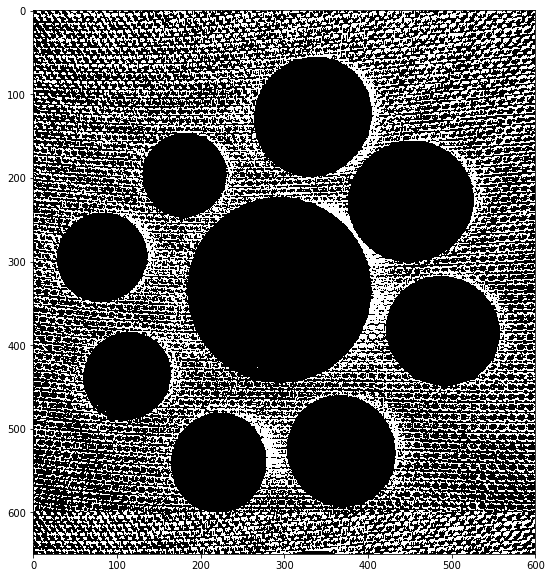

In [10]:
# Display the thresholded image
###
### YOUR CODE HERE
###

plt.imshow(threshold_image)

## <font style = "color:rgb(50,120,229)">Step 3.2: Perform morphological operations</font>

You will have to carry out this step with different kernel size, kernel shape and morphological operations to see which one (or more) suits you the most. Do not remove those intermediate images and make sure to document your findings.

__Plan of attack :__ Instead of going for one big kernel and few iterations, I will use one small kernel and lot of iterations. I drew such an inspiration from the concept of gradient descent where i use small learning rate and hence use small step size. I am okay with getting the perfect dilated image after a lot of iterations and it will help me to understand how the kernel size and iterations are working.

I loop over kernel of sizes (2,2), (3,3) and so on. I loop over iterations from 1 to 10.Here are the observations is found:- 

1. For kernel (2,2), we get the ideal image from iteratin 6 onwards. 

2. For kernel (3,3), we get the ideal image from iteration 4 onwards. 

3. For kernel (4,4), we get the ideal image from iteration 3 onwards. 

4. For kernel (5,5), we get the ideal image from iteration 2 only.

__Parameter selected:__ I will chose kernel of size (5,5) with 2 iterations. Also in the entire analysis I selected MORPH_ELLIPSE. 

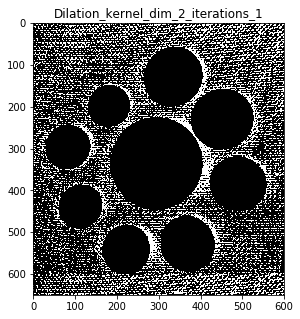

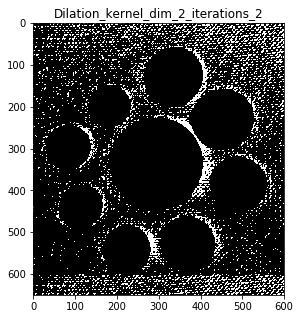

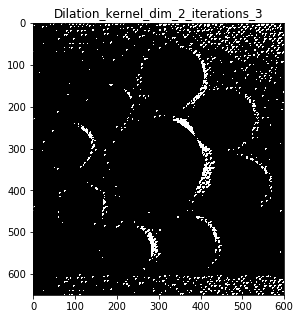

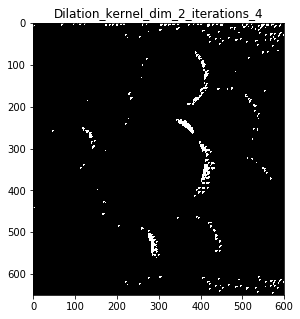

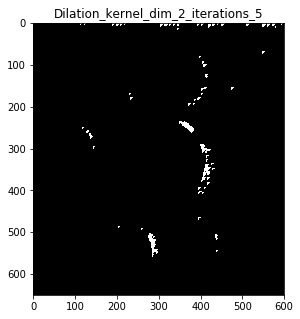

...

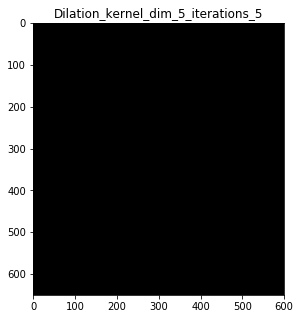

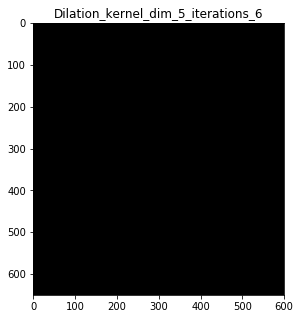

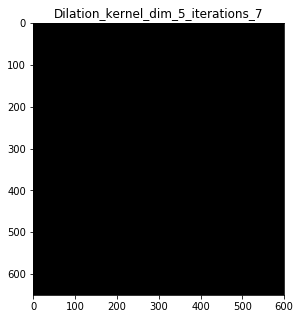

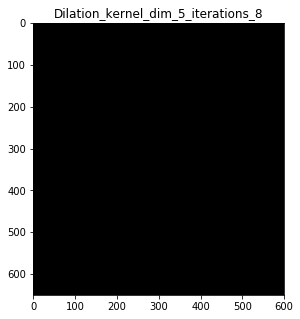

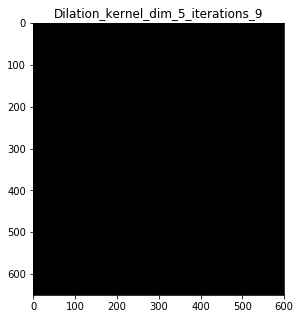

In [11]:
###
### YOUR CODE HERE
###
for i in range(2,6):
    for j in range(1,10):
        dims = i
        iteration = j
        kernel        = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(dims,dims))
        image_dilate  = cv2.morphologyEx(threshold_image,cv2.MORPH_OPEN,kernel,iterations= iteration)
        plt.figure(figsize=[5,5])
        plt.imshow(image_dilate)
        plt.title('Dilation_'+'kernel_dim_'+str(dims)+'_iterations_'+str(iteration))
        plt.pause(0.05)

In [12]:
###
### YOUR CODE HERE
###
kernel_dilate = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(5,5))
dilated_image = cv2.dilate(threshold_image,kernel_dilate,iterations = 2)

Text(0.5,1,'Image after dilation')

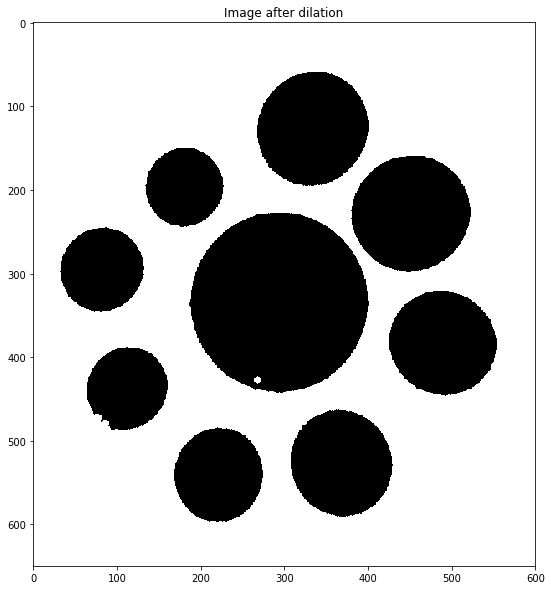

In [13]:
# Display all the images
# you have obtained in the intermediate steps
###
### YOUR CODE HERE
###
plt.imshow(dilated_image);
plt.title('Image after dilation')

I get a fair idea of the kernel I need to use for erosion. I need a kernel of size 3 and that will be sufficient with some iterations greater than 5

In [14]:
# Get structuring element/kernel which will be used for dilation
###
### YOUR CODE HERE
###
kernel_erode = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(3,3))

In [15]:
###
### YOUR CODE HERE
###
eroded_image = cv2.erode(dilated_image,kernel_erode,iterations=5)

Text(0.5,1,'Image after erosion')

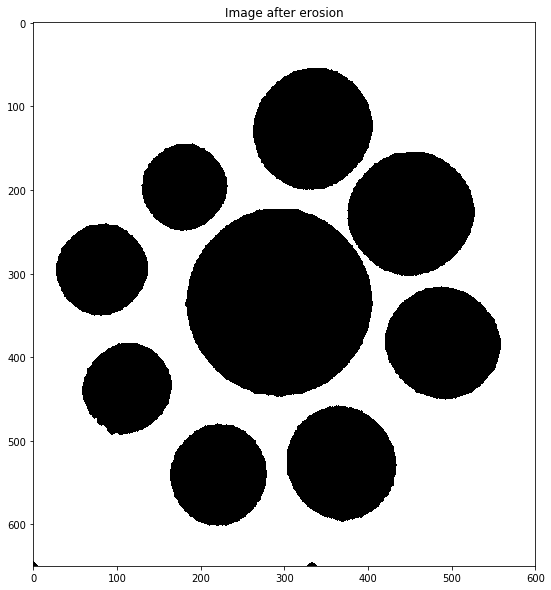

In [16]:
###
### YOUR CODE HERE
###
plt.imshow(eroded_image);
plt.title('Image after erosion')

## <font style = "color:rgb(50,120,229)">Step 4.1: Create SimpleBlobDetector</font>

In [17]:
# Set up the SimpleBlobdetector with default parameters.
params = cv2.SimpleBlobDetector_Params()

params.blobColor = 0

params.minDistBetweenBlobs = 2

# Filter by Area.
params.filterByArea = False

# Filter by Circularity
params.filterByCircularity = True
params.minCircularity = 0.8

# Filter by Convexity
params.filterByConvexity = True
params.minConvexity = 0.8

# Filter by Inertia
params.filterByInertia =True
params.minInertiaRatio = 0.8

In [18]:
# Create SimpleBlobDetector
detector = cv2.SimpleBlobDetector_create(params)

## <font style = "color:rgb(50,120,229)">Step 4.2: Detect Coins</font>

### <font style = "color:rgb(8,133,37)">Hints</font>
Use **`detector.detect(image)`** to detect the blobs (coins). The output of the function is a list of **keypoints** where each keypoint is unique for each blob.

Print the number of coins detected as well.

In [19]:
# Detect blobs
###
### YOUR CODE HERE
###
keypoints = detector.detect(eroded_image)

In [20]:
# Print number of coins detected
###
### YOUR CODE HERE
###
print('Number of coins detected = ',len(keypoints))

Number of coins detected =  9


**Note that we were able to detect all 9 coins. So, that's your benchmark.**

## <font style = "color:rgb(50,120,229)">Step 4.3: Display the detected coins on original image</font>

Make sure to mark the center of the blobs as well. **Use only the functions discussed in Image Annotation section in Week 1**

### <font style = "color:rgb(8,133,37)">Hints</font>
You can extract the coordinates of the center and the diameter of a blob using **`k.pt`** and **`k.size`** where `k` is a keypoint.

In [21]:
# Mark coins using image annotation concepts we have studied so far
###
### YOUR CODE HERE
###
im = imageCopy.copy()
for k in keypoints:
    x,y = k.pt
    x= int(round(x))
    y = int(round(y))
    cv2.circle(im,(x,y),5,(255,0,0),-1)
    diameter = k.size
    radius = int(round(diameter/2))
    cv2.circle(im,(x,y),radius,(0,255,0),2)

Text(0.5,1,'Final Image')

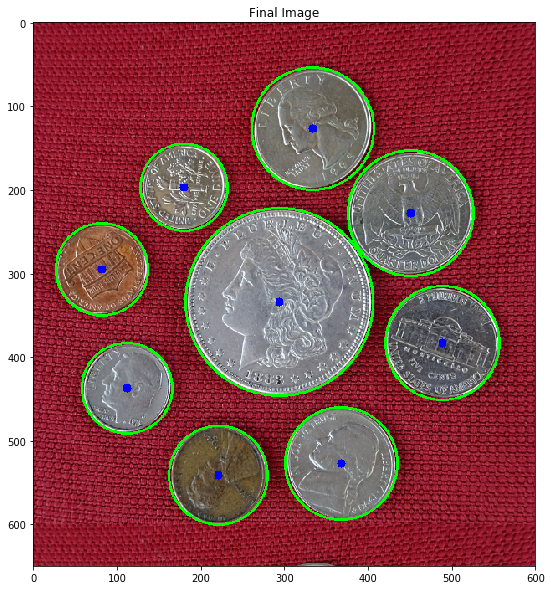

In [22]:
# Display the final image
###
### YOUR CODE HERE
###
plt.imshow(im[:,:,::-1]);
plt.title('Final Image')

## <font style = "color:rgb(50,120,229)">Step 4.4: Perform Connected Component Analysis</font>

In the final step, perform Connected Component Analysis (CCA) on the binary image to find out the number of connected components. Do you think we can use CCA to calculate number of coins? Why/why not?

In [23]:
def displayConnectedComponents(im):
    imLabels = im
    # The following line finds the min and max pixel values
    # and their locations in an image.
    (minVal, maxVal, minLoc, maxLoc) = cv2.minMaxLoc(imLabels)
    # Normalize the image so the min value is 0 and max value is 255.
    imLabels = 255 * (imLabels - minVal)/(maxVal-minVal)
    # Convert image to 8-bits unsigned type
    imLabels = np.uint8(imLabels)
    # Apply a color map
    imColorMap = cv2.applyColorMap(imLabels, cv2.COLORMAP_JET)
    # Display colormapped labels
    plt.imshow(imColorMap[:,:,::-1])

In [24]:
# Find connected components
###
### YOUR CODE HERE
###
_,imlabels = cv2.connectedComponents(cv2.bitwise_not(eroded_image))

In [25]:
# Print number of connected components detected
###
### YOUR CODE HERE
###
print('Number of connected components detected = ',imlabels.max())

Number of connected components detected =  11


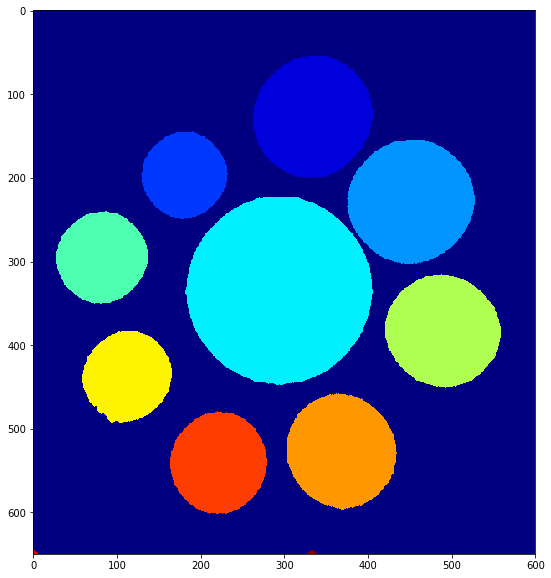

In [26]:
# Display connected components using displayConnectedComponents
# function
###
### YOUR CODE HERE
###
displayConnectedComponents(imlabels)

## <font style = "color:rgb(50,120,229)">Step 4.5: Detect coins using Contour Detection</font>

In the final step, perform Contour Detection on the binary image to find out the number of coins.

In [27]:
# Find all contours in the image
###
### YOUR CODE HERE
###
imageContour = imageCopy.copy()
contours,hierarchy = cv2.findContours(eroded_image,cv2.RETR_LIST,cv2.CHAIN_APPROX_NONE)

In [28]:
# Print the number of contours found
###
### YOUR CODE HERE
###
print('The number of contours = ',hierarchy.shape[1])

The number of contours =  10


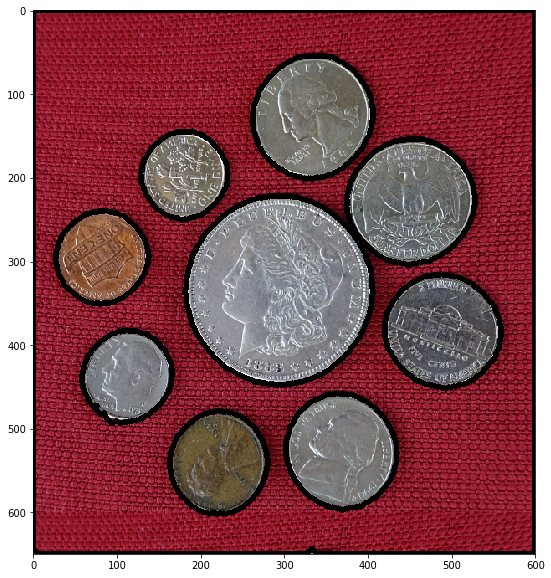

In [29]:
# Draw all contours
###
### YOUR CODE HERE
###
cv2.drawContours(imageContour,contours,-1,(0,0,0),5)
plt.imshow(imageContour[:,:,::-1])

Let's only consider the outer contours.

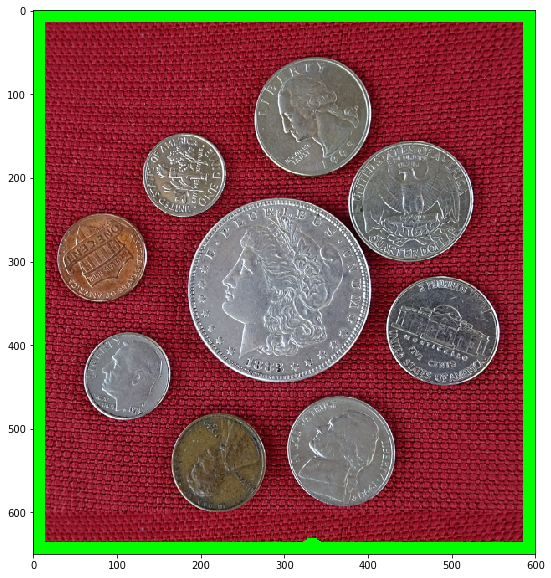

In [30]:
# Remove the inner contours
outer_contour = contours[-1]
# Display the result
###
### YOUR CODE HERE
###
outercontourimage = imageCopy.copy()
cv2.drawContours(outercontourimage,[outer_contour],0,(0,255,0),25);
plt.imshow(outercontourimage[:,:,::-1]);

So, we only need the inner contours. The easiest way to do that will be to remove the outer contour using area.

In [31]:
# Print area and perimeter of all contours
###
### YOUR CODE HERE
###
area_list = []
for index,cnt in enumerate(contours):
    area = cv2.contourArea(cnt)
    area_list.append(area)
    perimeter = cv2.arcLength(cnt,True)
    print('Contour #',str(index+1),' has area = ',area,' and perimeter = ',perimeter)

Contour # 1  has area =  11118.0  and perimeter =  401.9310202598572
Contour # 2  has area =  14133.5  and perimeter =  456.94321286678314
Contour # 3  has area =  9075.5  and perimeter =  373.20309841632843
Contour # 4  has area =  14482.5  and perimeter =  456.80107748508453
Contour # 5  has area =  9404.5  and perimeter =  367.546244263649
Contour # 6  has area =  39121.5  and perimeter =  748.3645666837692
Contour # 7  has area =  17612.0  and perimeter =  500.84270763397217
Contour # 8  has area =  8298.5  and perimeter =  344.57568180561066
Contour # 9  has area =  16370.5  and perimeter =  484.1147857904434
Contour # 10  has area =  388697.0  and perimeter =  2497.4558436870575


In [32]:
# Print maximum area of contour
# This will be the box that we want to remove
###
### YOUR CODE HERE
###
print('Maximum area of contour = ',np.max(np.array(area_list)))

Maximum area of contour =  388697.0


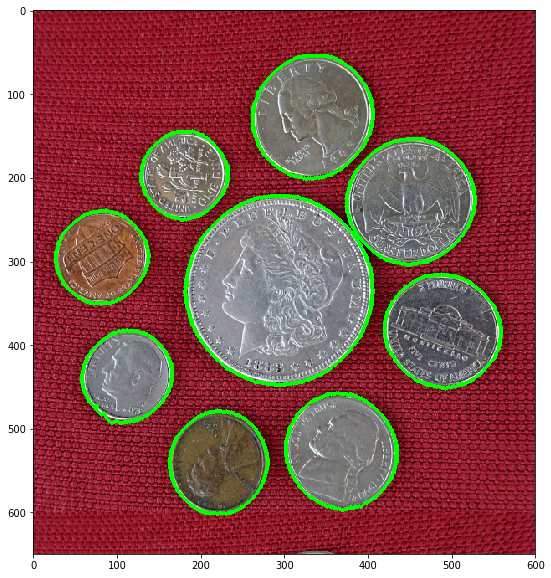

In [33]:
# Remove this contour and plot others
###
### YOUR CODE HERE
###
inner_contours = contours.copy()
inner_contours.pop(np.argmax(np.array(area_list)));
innercontourimage = imageCopy.copy()
cv2.drawContours(innercontourimage,inner_contours,-1,(0,255,0),3);
plt.imshow(innercontourimage[:,:,::-1]);

Number of coins detected =  9


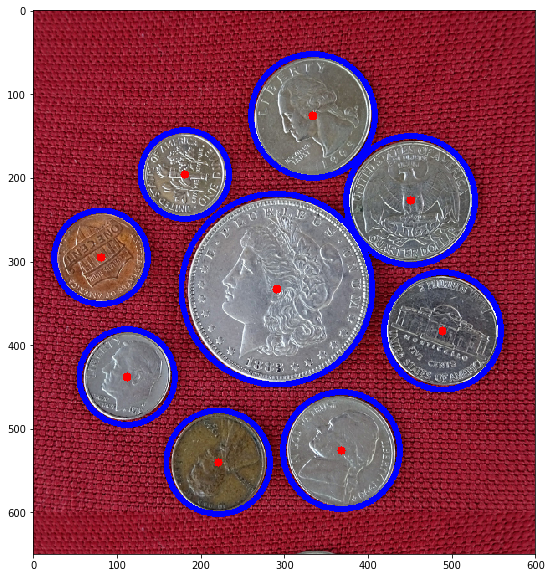

In [37]:
# Fit circles on coins
###
### YOUR CODE HERE
###
final_image = imageCopy.copy()
for cnt in inner_contours:
    (x,y),radius = cv2.minEnclosingCircle(cnt)
    center = (int(x),int(y))
    radius = int(radius)
    cv2.circle(final_image,center,radius,(255,0,0),5)
    cv2.circle(final_image,center,5,(0,0,255),-1);
print("Number of coins detected = ",len(inner_contours))
plt.imshow(final_image[:,:,::-1])

# <font style = "color:rgb(50,120,229)">Assignment Part - B</font>

**Follow the same steps as provided in Assignment Part - A**

## <font style = "color:rgb(50,120,229)"> Step 1: Read Image</font>

Text(0.5,1,'Original Image')

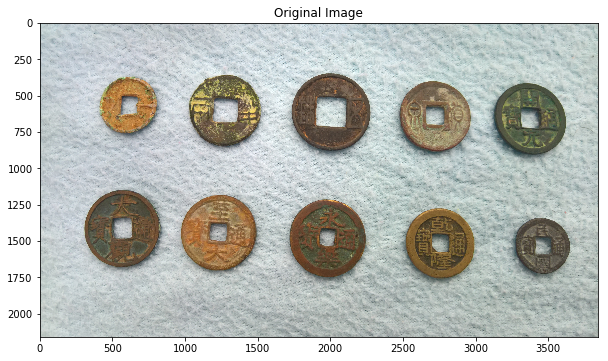

In [164]:
# Image path
imagePath = DATA_PATH + "images/CoinsB.png"
# Read image
# Store it in variable image
###
### YOUR CODE HERE
###
image = cv2.imread(imagePath)
imageCopy = image.copy()
plt.imshow(image[:,:,::-1]);
plt.title("Original Image")

## <font style = "color:rgb(50,120,229)">Step 2.1: Convert Image to Grayscale</font>

In [39]:
# Convert to grayscale
# Store in variable imageGray
###
### YOUR CODE HERE
###
imageGray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

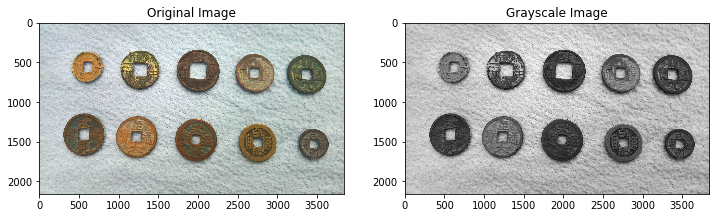

In [40]:
plt.figure(figsize=(12,12))
plt.subplot(121)
plt.imshow(image[:,:,::-1]);
plt.title("Original Image")
plt.subplot(122)
plt.imshow(imageGray);
plt.title("Grayscale Image");

## <font style = "color:rgb(50,120,229)">Step 2.2: Split Image into R,G,B Channels</font>

In [41]:
# Split cell into channels
# Variables are: imageB, imageG, imageR
###
### YOUR CODE HERE
###
imageB,imageG,imageR = cv2.split(image)

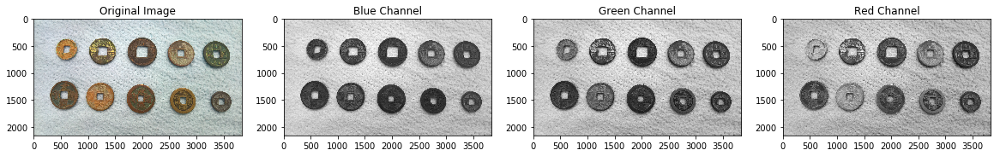

In [42]:
plt.figure(figsize=(20,12))
plt.subplot(141)
plt.imshow(image[:,:,::-1]);
plt.title("Original Image")
plt.subplot(142)
plt.imshow(imageB);
plt.title("Blue Channel")
plt.subplot(143)
plt.imshow(imageG);
plt.title("Green Channel")
plt.subplot(144)
plt.imshow(imageR);
plt.title("Red Channel");

## <font style = "color:rgb(50,120,229)">Step 3.1: Perform Thresholding</font>

You will have to carry out this step with different threshold values to see which one suits you the most. Do not remove those intermediate images and make sure to document your findings.

Using the same procedure as explained in assignment A, I arrived at following parameters

__Parameter to use :__ 

Threshold :- 135 

Image :- imageb (the Blue channel image) 

Max value :- 255 

Threshold Type :- Binary 

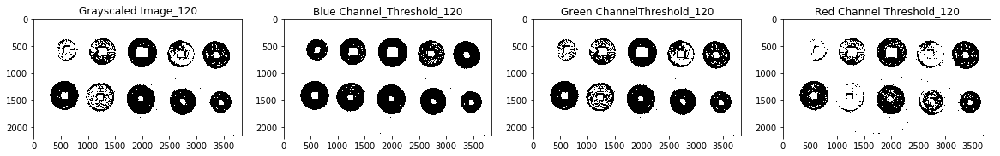

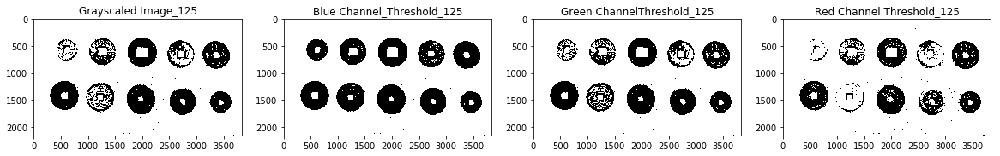

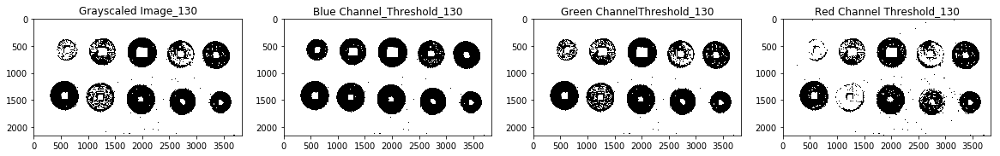

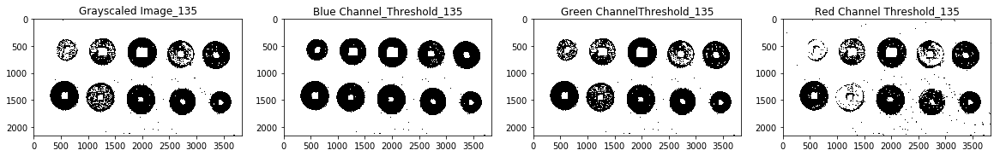

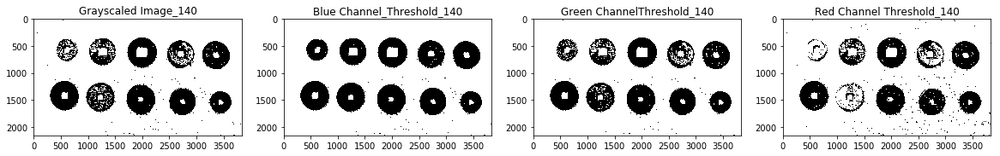

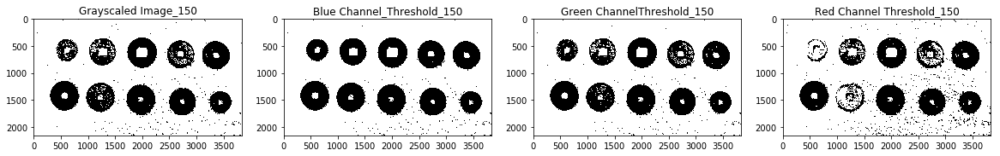

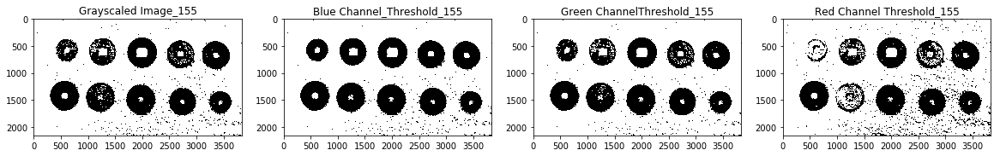

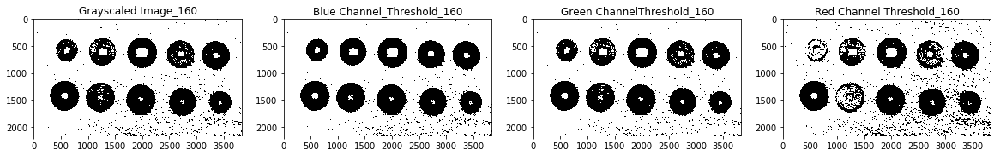

In [43]:
###
### YOUR CODE HERE
###
threshold_parameter_grid_attempt1 = [10,20,30,40]
threshold_parameter_grid_attempt2 = [60,80,100]
threshold_parameter_grid_attempt3 = [100,120,140,160,180,200]
threshold_parameter_grid_attempt4 = [120,125,130,135,140,150,155,160]

threshold_parameter_grid  = threshold_parameter_grid_attempt4
for i in range(len(threshold_parameter_grid)):
    threshold    = threshold_parameter_grid[i]
    maxvalue     = 255
    _,thresh_image_red   = cv2.threshold(src = imageR,thresh = threshold,maxval=maxvalue,type = cv2.THRESH_BINARY)
    _,thresh_image_green = cv2.threshold(src = imageG,thresh = threshold,maxval=maxvalue,type = cv2.THRESH_BINARY)
    _,thresh_image_blue  = cv2.threshold(src = imageB,thresh = threshold,maxval=maxvalue,type = cv2.THRESH_BINARY)
    _,thresh_image_gray  = cv2.threshold(src = imageGray,thresh = threshold,maxval=maxvalue,type = cv2.THRESH_BINARY)
    plt.figure(figsize=(20,12))
    plt.subplot(141)
    plt.imshow(thresh_image_gray);
    plt.title("Grayscaled Image_"+str(threshold))
    plt.subplot(142)
    plt.imshow(thresh_image_blue);
    plt.title("Blue Channel_Threshold_"+str(threshold))
    plt.subplot(143)
    plt.imshow(thresh_image_green);
    plt.title("Green ChannelThreshold_"+str(threshold))
    plt.subplot(144)
    plt.imshow(thresh_image_red);
    plt.title("Red Channel Threshold_"+str(threshold));

In [44]:
_,threshold_image = cv2.threshold(src = imageB,thresh = 135,maxval=255,type = cv2.THRESH_BINARY)

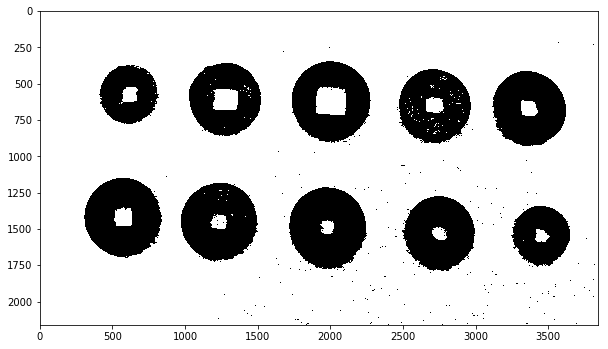

In [45]:
# Display image using matplotlib
###
### YOUR CODE HERE
###
plt.imshow(threshold_image)

## <font style = "color:rgb(50,120,229)">Step 3.2: Perform morphological operations</font>

You will have to carry out this step with different kernel size, kernel shape and morphological operations to see which one (or more) suits you the most. Do not remove those intermediate images and make sure to document your findings.

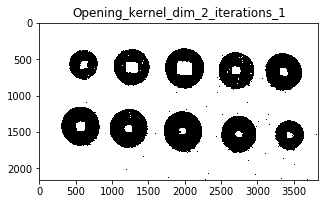

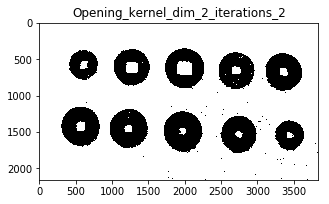

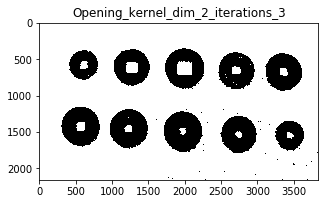

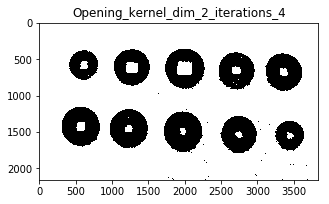

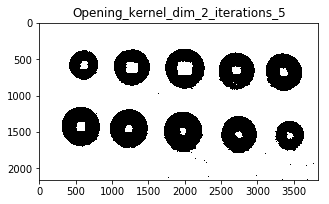

...

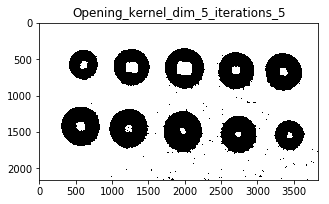

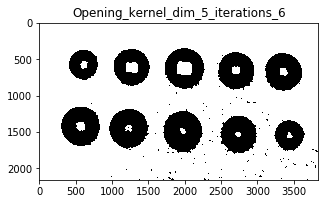

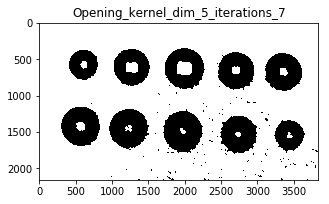

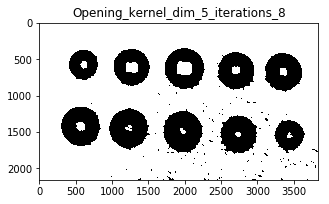

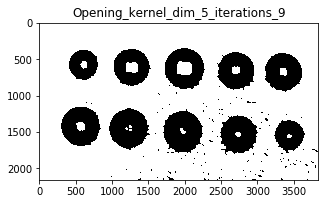

In [46]:
###
### YOUR CODE HERE
###
for i in range(2,6):
    for j in range(1,10):
        dims = i
        iteration = j
        kernel        = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(dims,dims))
        image_open    = cv2.morphologyEx(threshold_image,cv2.MORPH_OPEN,kernel,iterations= iteration)
        plt.figure(figsize=[5,5])
        plt.imshow(image_open)
        plt.title('Opening_'+'kernel_dim_'+str(dims)+'_iterations_'+str(iteration))
        plt.pause(0.05)

__Parameter selected:__ I will chose kernel of size (2,2) with 9 iterations. Also in the entire analysis I selected MORPH_ELLIPSE.

The logic is similar to the ones used in assignment A

In [47]:
###
### YOUR CODE HERE
###
kernel_open   = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(2,2))
image_open    = cv2.morphologyEx(threshold_image,cv2.MORPH_OPEN,kernel_open,iterations= 9)

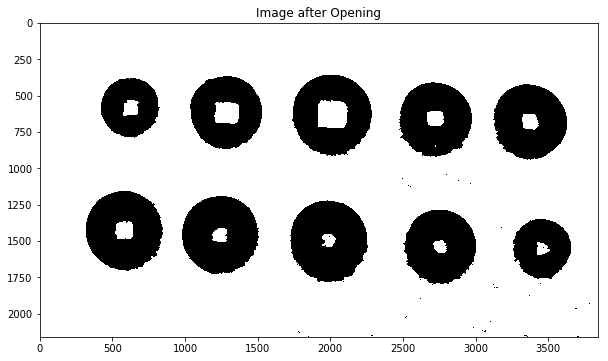

In [48]:
###
### YOUR CODE HERE
###
plt.imshow(image_open);
plt.title('Image after Opening');

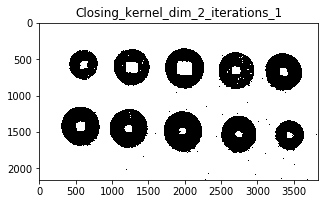

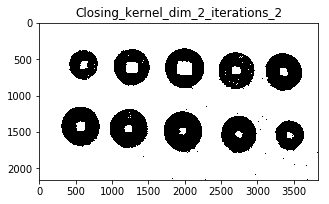

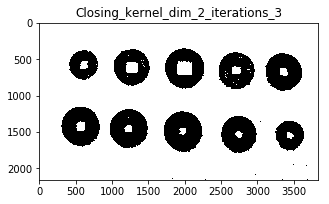

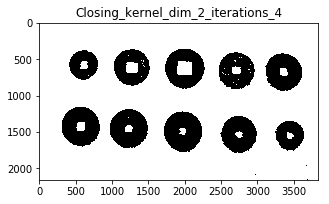

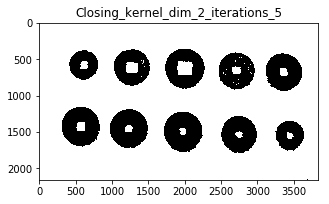

...

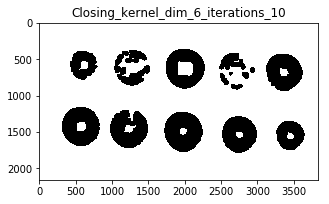

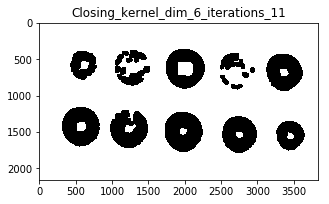

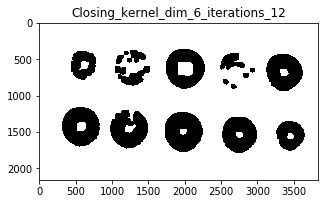

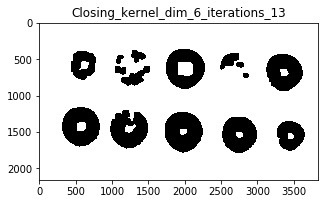

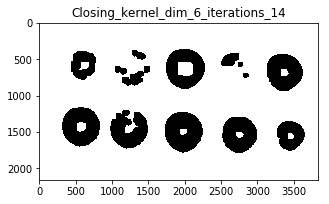

In [49]:
###
### YOUR CODE HERE
###
for i in range(2,7):
    for j in range(1,15):
        dims = i
        iteration = j
        kernel        = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(dims,dims))
        image_close   = cv2.morphologyEx(threshold_image,cv2.MORPH_CLOSE,kernel,iterations= iteration)
        plt.figure(figsize=[5,5])
        plt.imshow(image_close)
        plt.title('Closing_'+'kernel_dim_'+str(dims)+'_iterations_'+str(iteration))
        plt.pause(0.05)

We proceed in a same way as before to get the best parameters for closing and the kernel size is 6 with 14 iterations

In [50]:
###
### YOUR CODE HERE
###
kernel_close   = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(6,6))
image_close    = cv2.morphologyEx(threshold_image,cv2.MORPH_CLOSE,kernel_open,iterations= 2)

Text(0.5,1,'Image after Closing')

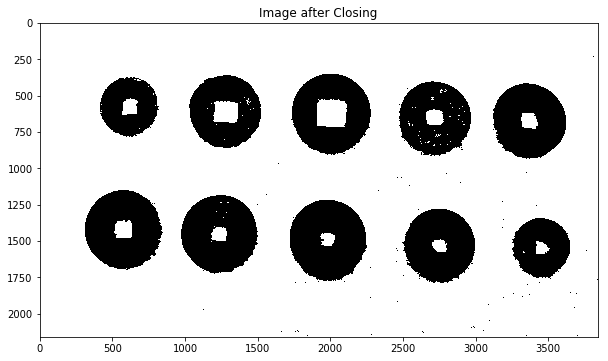

In [51]:
###
### YOUR CODE HERE
###
plt.imshow(image_close);
plt.title('Image after Closing')

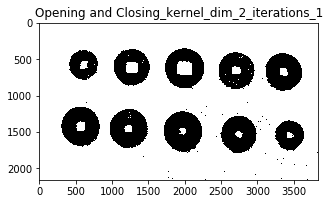

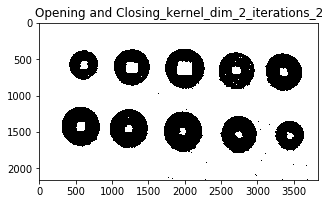

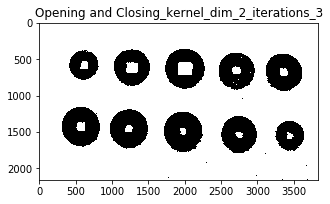

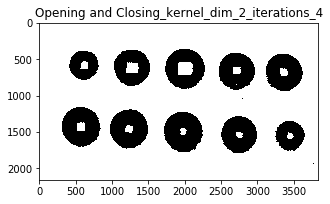

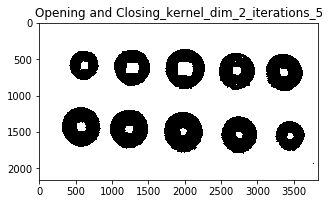

...

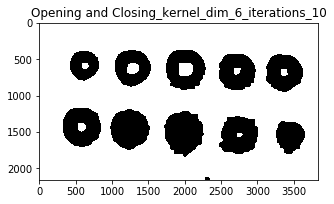

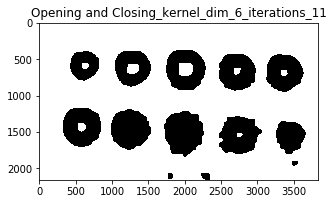

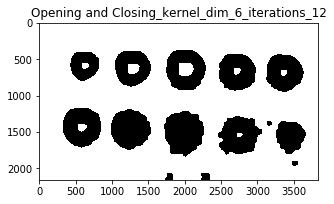

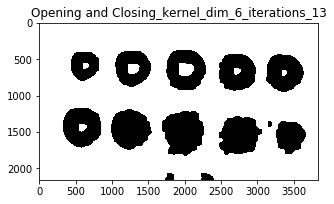

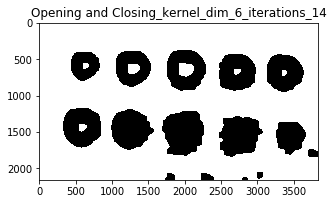

In [52]:
###
### YOUR CODE HERE
###
for i in range(2,7):
    for j in range(1,15):
        dims = i
        iteration = j
        kernel        = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(dims,dims))
        image_open    = cv2.morphologyEx(threshold_image,cv2.MORPH_OPEN,kernel,iterations= iteration)
        image_close   = cv2.morphologyEx(image_open,cv2.MORPH_CLOSE,kernel,iterations= iteration)
        plt.figure(figsize=[5,5])
        plt.imshow(image_close)
        plt.title('Opening and Closing_'+'kernel_dim_'+str(dims)+'_iterations_'+str(iteration))
        plt.pause(0.05)

__Opening and then Closing:__ Kernel dimension for both the operations = 4 and we select 6 iterations for both (can be done with different dimensions but i found it time consuming to run separate loops and i was getting satisfactory answer anyways) 

In [53]:
###
### YOUR CODE HERE
###
kernel        = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(4,4))
image_open    = cv2.morphologyEx(threshold_image,cv2.MORPH_OPEN,kernel,iterations= 6)
image_close_after_open   = cv2.morphologyEx(image_open,cv2.MORPH_CLOSE,kernel,iterations= 6)

Text(0.5,1,'Image after opening and then closing')

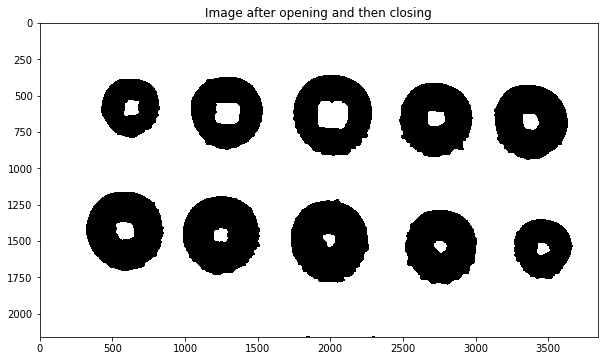

In [58]:
###
### YOUR CODE HERE
###
plt.imshow(image_close_after_open);
plt.title('Image after opening and then closing')

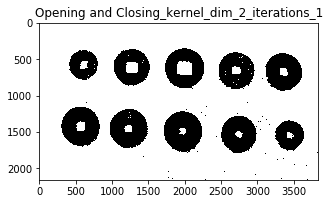

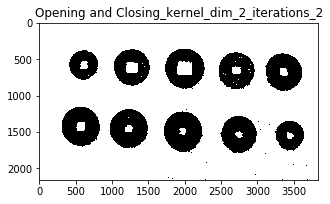

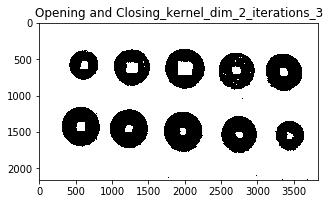

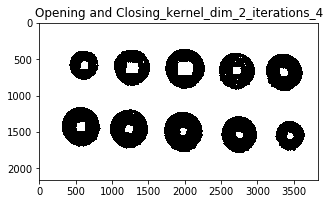

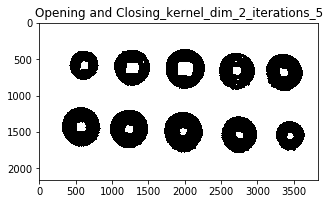

...

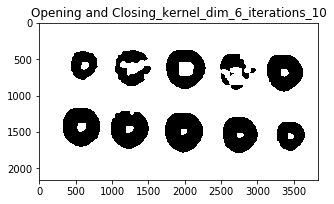

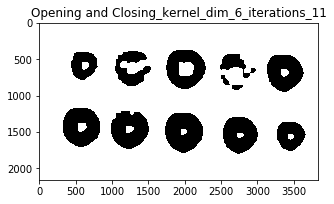

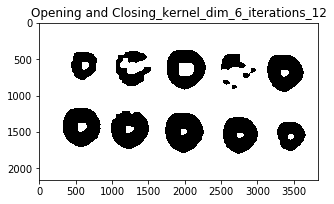

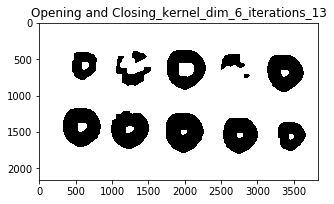

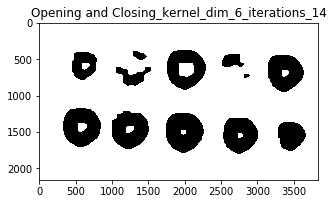

In [55]:
###
### YOUR CODE HERE
###
for i in range(2,7):
    for j in range(1,15):
        dims = i
        iteration = j
        kernel        = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(dims,dims))
        image_close   = cv2.morphologyEx(threshold_image,cv2.MORPH_CLOSE,kernel,iterations= iteration)
        image_open    = cv2.morphologyEx(image_close,cv2.MORPH_OPEN,kernel,iterations= iteration)
        plt.figure(figsize=[5,5])
        plt.imshow(image_open)
        plt.title('Opening and Closing_'+'kernel_dim_'+str(dims)+'_iterations_'+str(iteration))
        plt.pause(0.05)

In [56]:
###
### YOUR CODE HERE
###
kernel = (4,4)
iteration = 4
image_close   = cv2.morphologyEx(threshold_image,cv2.MORPH_CLOSE,kernel,iterations= iteration)
image_open_after_close    = cv2.morphologyEx(image_close,cv2.MORPH_OPEN,kernel,iterations= iteration)

Text(0.5,1,'Image after closing and then opening')

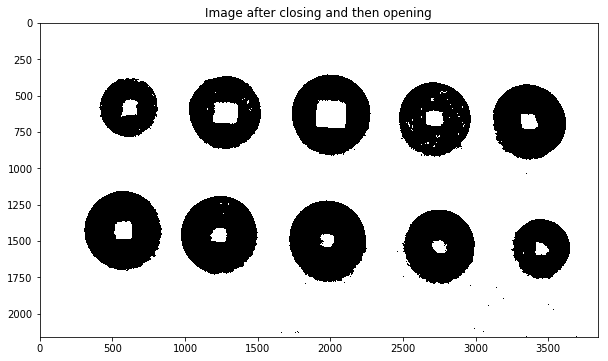

In [57]:
###
### YOUR CODE HERE
###
plt.imshow(image_open_after_close);
plt.title('Image after closing and then opening')

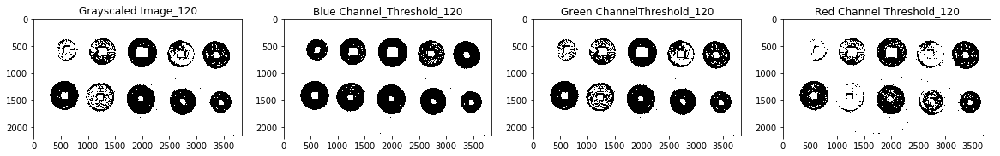

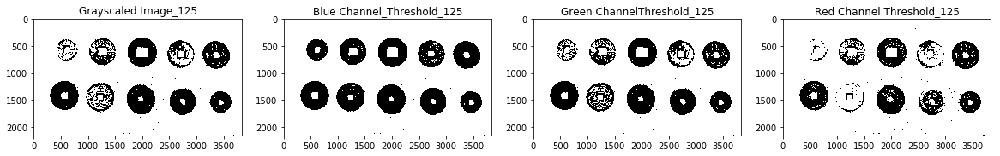

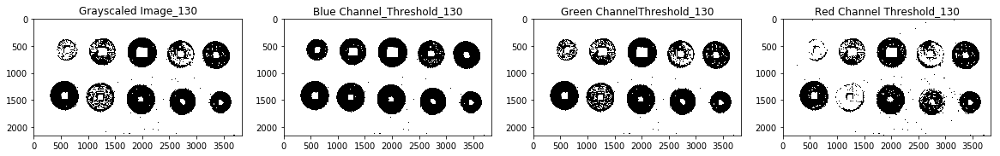

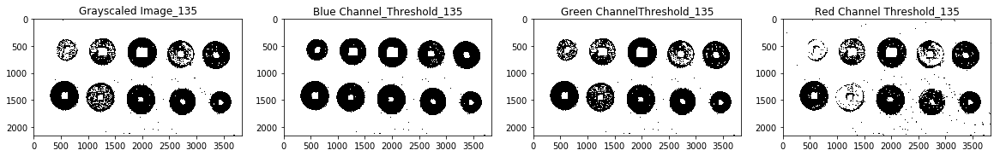

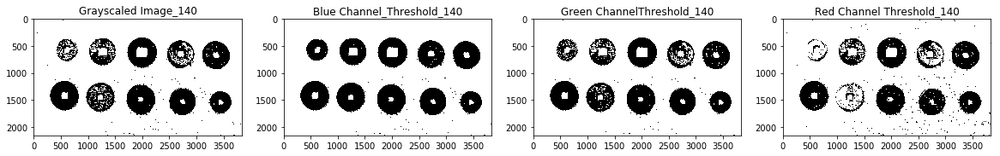

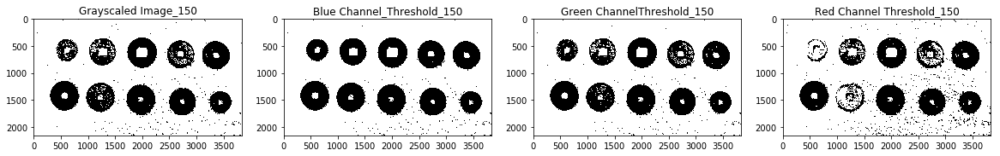

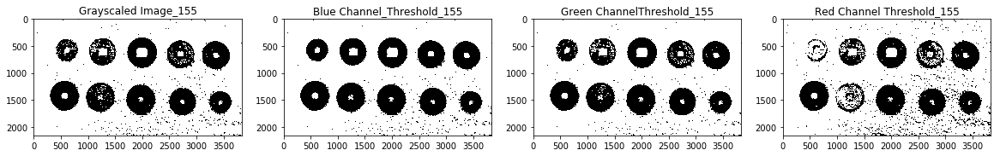

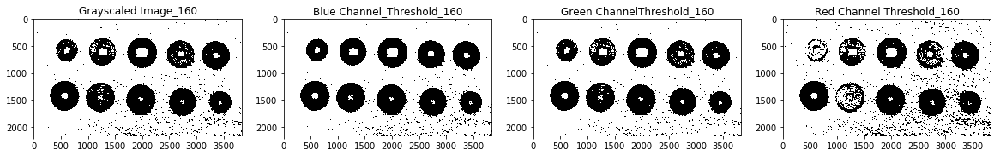

In [59]:
###
### YOUR CODE HERE
###
threshold_parameter_grid_attempt1 = [10,20,30,40]
threshold_parameter_grid_attempt2 = [60,80,100]
threshold_parameter_grid_attempt3 = [100,120,140,160,180,200]
threshold_parameter_grid_attempt4 = [120,125,130,135,140,150,155,160]

threshold_parameter_grid  = threshold_parameter_grid_attempt4
for i in range(len(threshold_parameter_grid)):
    threshold    = threshold_parameter_grid[i]
    maxvalue     = 255
    _,thresh_image_red   = cv2.threshold(src = imageR,thresh = threshold,maxval=maxvalue,type = cv2.THRESH_BINARY)
    _,thresh_image_green = cv2.threshold(src = imageG,thresh = threshold,maxval=maxvalue,type = cv2.THRESH_BINARY)
    _,thresh_image_blue  = cv2.threshold(src = imageB,thresh = threshold,maxval=maxvalue,type = cv2.THRESH_BINARY)
    _,thresh_image_gray  = cv2.threshold(src = imageGray,thresh = threshold,maxval=maxvalue,type = cv2.THRESH_BINARY)
    plt.figure(figsize=(20,12))
    plt.subplot(141)
    plt.imshow(thresh_image_gray);
    plt.title("Grayscaled Image_"+str(threshold))
    plt.subplot(142)
    plt.imshow(thresh_image_blue);
    plt.title("Blue Channel_Threshold_"+str(threshold))
    plt.subplot(143)
    plt.imshow(thresh_image_green);
    plt.title("Green ChannelThreshold_"+str(threshold))
    plt.subplot(144)
    plt.imshow(thresh_image_red);
    plt.title("Red Channel Threshold_"+str(threshold));

In [81]:
###
### YOUR CODE HERE
###
_,mod_threshold_image = cv2.threshold(src = imageB,thresh = 160,maxval=255,type = cv2.THRESH_BINARY)

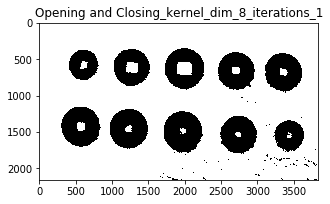

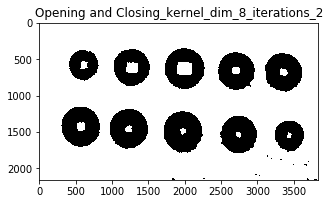

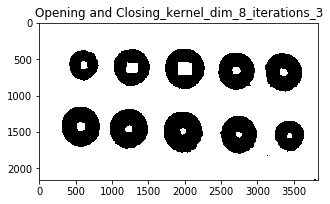

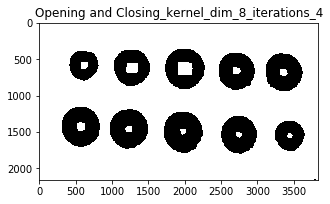

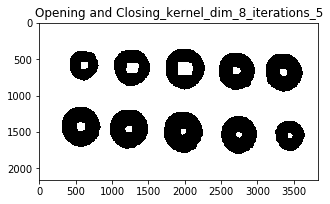

...

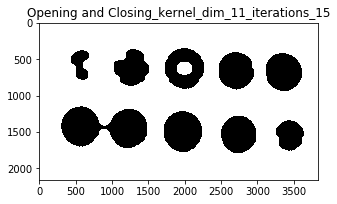

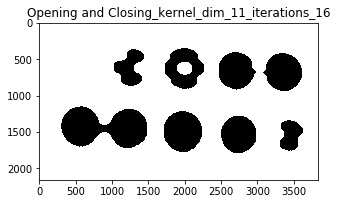

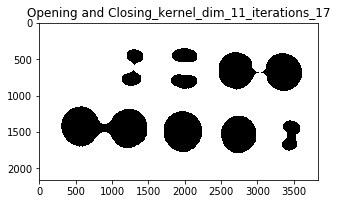

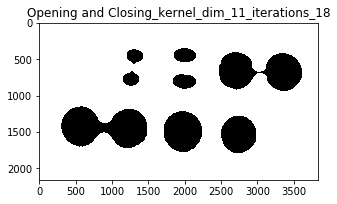

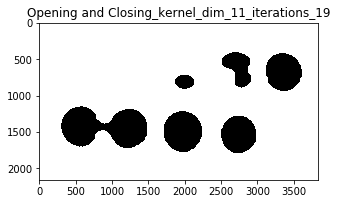

In [84]:
for i in range(8,12):
    for j in range(1,20):
        dims = i
        iteration = j
        kernel        = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(dims,dims))
        image_close   = cv2.morphologyEx(mod_threshold_image,cv2.MORPH_CLOSE,kernel,iterations= iteration)
        image_open    = cv2.morphologyEx(image_close,cv2.MORPH_OPEN,kernel,iterations= iteration)
        plt.figure(figsize=[5,5])
        plt.imshow(image_open)
        plt.title('Opening and Closing_'+'kernel_dim_'+str(dims)+'_iterations_'+str(iteration))
        plt.pause(0.05)

In [145]:
###
### YOUR CODE HERE
###
kernel        = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(9,9))
image_close   = cv2.morphologyEx(mod_threshold_image,cv2.MORPH_CLOSE,kernel,iterations= 15)
image_open    = cv2.morphologyEx(image_close,cv2.MORPH_OPEN,kernel,iterations= 15)

Text(0.5,1,'Image after closing and then opening')

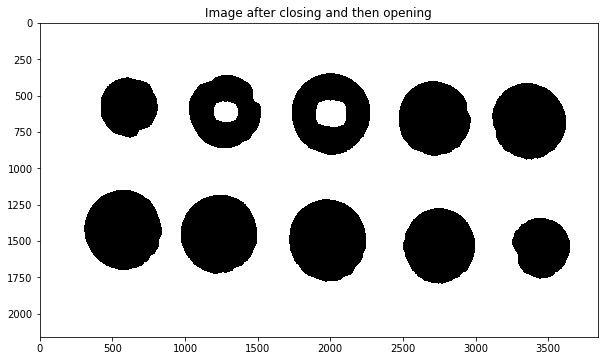

In [146]:
###
### YOUR CODE HERE
###
plt.imshow(image_open);
plt.title('Image after closing and then opening')

In [155]:
###
### YOUR CODE HERE
###
kernel        = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(5,5))
image_close   = cv2.morphologyEx(image_open,cv2.MORPH_CLOSE,kernel,iterations= 5)
image_open    = cv2.morphologyEx(image_close,cv2.MORPH_OPEN,kernel,iterations= 5)

Text(0.5,1,'Image after closing and then opening')

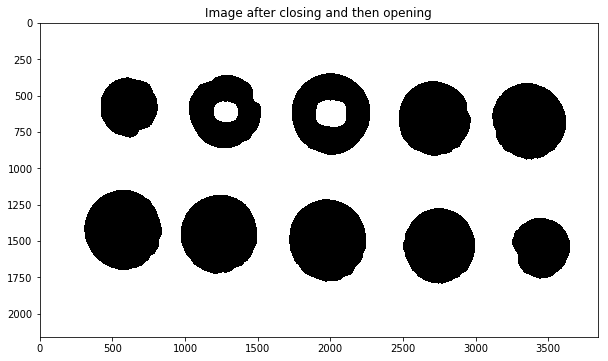

In [156]:
###
### YOUR CODE HERE
###
plt.imshow(image_open);
plt.title('Image after closing and then opening')

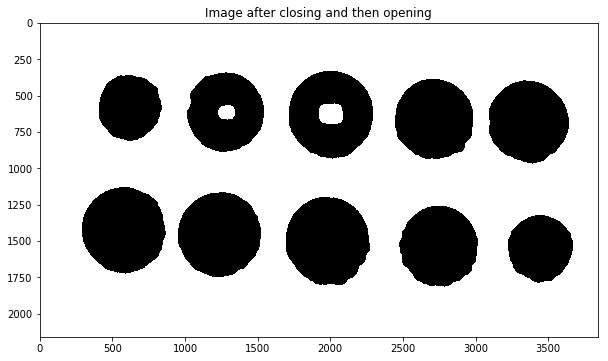

In [50]:
###
### YOUR CODE HERE
###


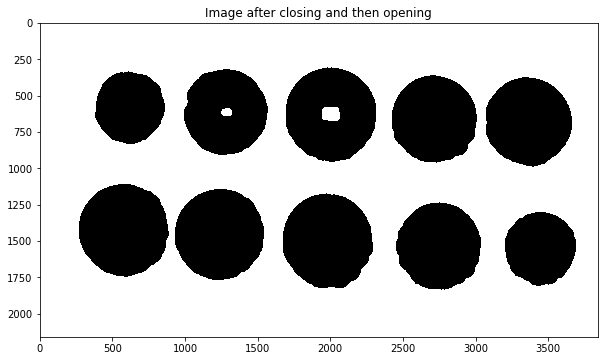

In [51]:
###
### YOUR CODE HERE
###


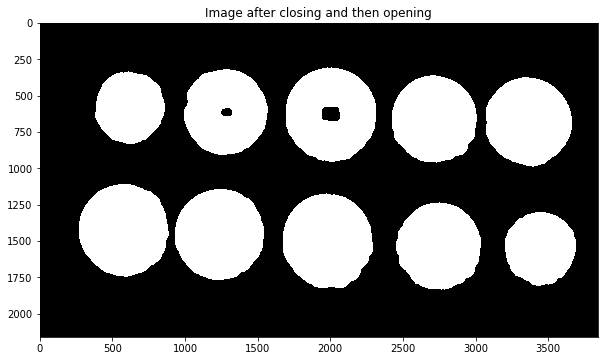

In [52]:
###
### YOUR CODE HERE
###


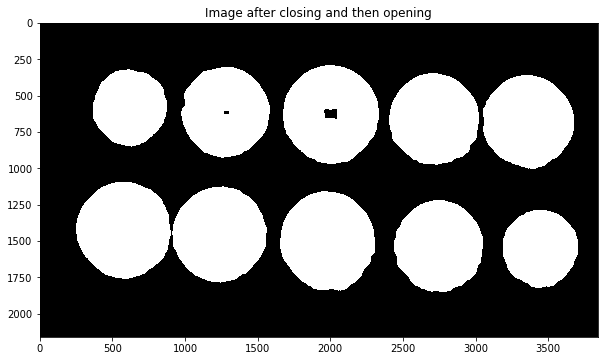

In [53]:
###
### YOUR CODE HERE
###


## <font style = "color:rgb(50,120,229)">Step 4.1: Create SimpleBlobDetector</font>

In [157]:
# Set up the SimpleBlobdetector with default parameters.
params = cv2.SimpleBlobDetector_Params()

params.blobColor = 0

params.minDistBetweenBlobs = 2

# Filter by Area.
params.filterByArea = False

# Filter by Circularity
params.filterByCircularity = True
params.minCircularity = 0.8

# Filter by Convexity
params.filterByConvexity = True
params.minConvexity = 0.8

# Filter by Inertia
params.filterByInertia =True
params.minInertiaRatio = 0.8

In [158]:
# Create SimpleBlobDetector
detector = cv2.SimpleBlobDetector_create(params)


## <font style = "color:rgb(50,120,229)">Step 4.2: Detect Coins</font>

### <font style = "color:rgb(8,133,37)">Hints</font>
Use **`detector.detect(image)`** to detect the blobs (coins). The output of the function is a list of **keypoints** where each keypoint is unique for each blob.

Print the number of coins detected as well.

In [160]:
keypoints = detector.detect(image_open)
 
# Print number of coins detected
###
### YOUR CODE HERE
###
print('Number of coins detected = ',len(keypoints))

Number of coins detected =  8


In [161]:
# Detect blobs
###
### YOUR CODE HERE
###
keypoints = detector.detect(image_open)
print('Number of coins detected = ',len(keypoints))

Number of coins detected =  8


## <font style = "color:rgb(50,120,229)">Step 4.3: Display the detected coins on original image</font>

Make sure to mark the center of the blobs as well. **Use only the functions discussed in Image Annotation section in Week 1**

### <font style = "color:rgb(8,133,37)">Hints</font>
You can extract the coordinates of the center and the diameter of a blob using **`k.pt`** and **`k.size`** where `k` is a keypoint.

In [169]:
###
### YOUR CODE HERE
###
im = imageCopy.copy()
for k in keypoints:
    x,y = k.pt
    x= int(round(x))
    y = int(round(y))
    cv2.circle(im,(x,y),5,(255,0,0),-1)
    diameter = k.size
    radius = int(round(diameter/2))
    cv2.circle(im,(x,y),radius,(0,0,255),8)

Text(0.5,1,'Final Image')

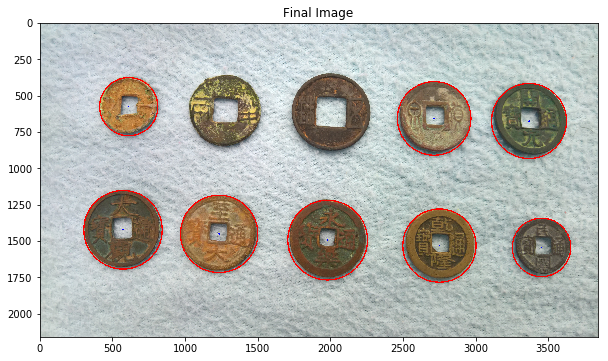

In [170]:
###
### YOUR CODE HERE
###
plt.imshow(im[:,:,::-1]);
plt.title('Final Image')

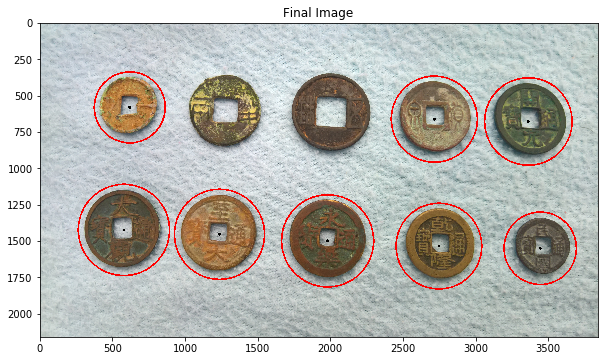

In [59]:
###
### YOUR CODE HERE
###


**Note that we were able to detect 8 coins. So, that's your benchmark.**

## <font style = "color:rgb(50,120,229)">Step 4.4: Perform Connected Component Analysis</font>

Now, let's perform Connected Component Analysis (CCA) on the binary image to find out the number of connected components. Do you think we can use CCA to calculate number of coins? Why/why not?

In [171]:
###
### YOUR CODE HERE
###
def displayConnectedComponents(im):
    imLabels = im
    # The following line finds the min and max pixel values
    # and their locations in an image.
    (minVal, maxVal, minLoc, maxLoc) = cv2.minMaxLoc(imLabels)
    # Normalize the image so the min value is 0 and max value is 255.
    imLabels = 255 * (imLabels - minVal)/(maxVal-minVal)
    # Convert image to 8-bits unsigned type
    imLabels = np.uint8(imLabels)
    # Apply a color map
    imColorMap = cv2.applyColorMap(imLabels, cv2.COLORMAP_JET)
    # Display colormapped labels
    plt.imshow(imColorMap[:,:,::-1])

In [172]:
# Find connected components
###
### YOUR CODE HERE
###
_,imlabels = cv2.connectedComponents(cv2.bitwise_not(image_open))

In [173]:
# Print number of connected components detected
###
### YOUR CODE HERE
###
print('Number of connected components detected = ',imlabels.max())

Number of connected components detected =  10


In [61]:
###
### YOUR CODE HERE
###


Number of connected components detected = 11


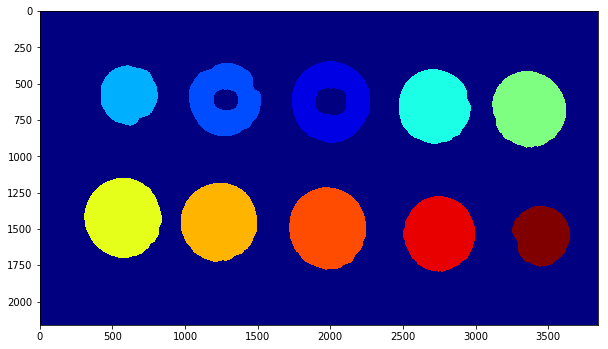

In [174]:
# Display connected components using displayConnectedComponents
# function
###
### YOUR CODE HERE
###
displayConnectedComponents(imlabels)

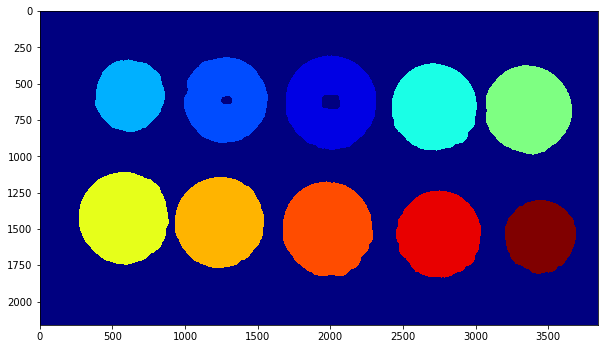

In [62]:
###
### YOUR CODE HERE
###


## <font style = "color:rgb(50,120,229)">Step 4.5: Detect coins using Contour Detection</font>

In the final step, perform Contour Detection on the binary image to find out the number of coins.

In [175]:
# Find all contours in the image
###
### YOUR CODE HERE
###
imageContour = imageCopy.copy()
contours,hierarchy = cv2.findContours(image_open,cv2.RETR_LIST,cv2.CHAIN_APPROX_NONE)

In [177]:
# Print the number of contours found
###
### YOUR CODE HERE
###
print('Number of contours found = ',hierarchy.shape[1])

Number of contours found =  13


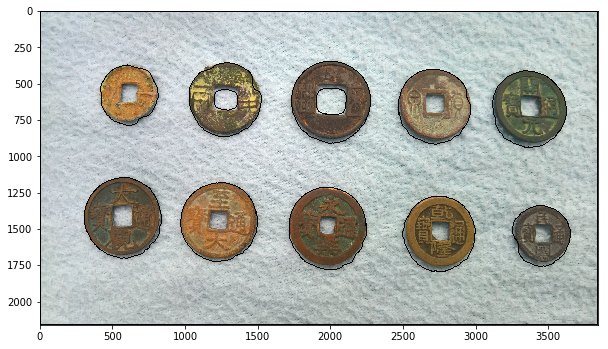

In [178]:
# Draw all contours
###
### YOUR CODE HERE
###
cv2.drawContours(imageContour,contours,-1,(0,0,0),5)
plt.imshow(imageContour[:,:,::-1])

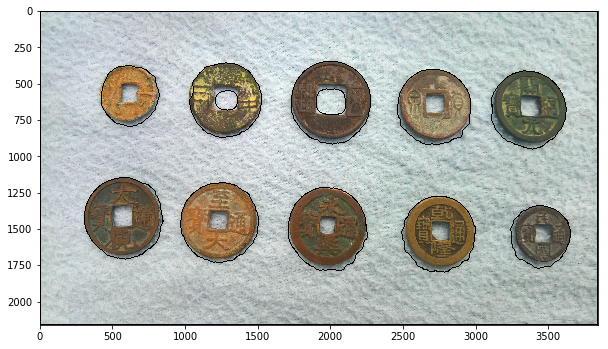

In [65]:
# Draw all contours
###
### YOUR CODE HERE
###


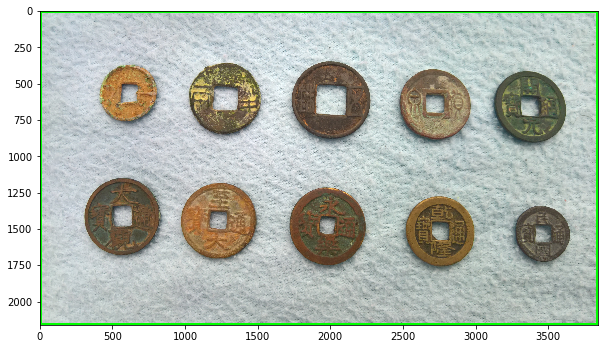

In [179]:
# Remove the inner contours
outer_contour = contours[-1]
# Display the result
###
### YOUR CODE HERE
###
outercontourimage = imageCopy.copy()
cv2.drawContours(outercontourimage,[outer_contour],0,(0,255,0),25);
plt.imshow(outercontourimage[:,:,::-1]);

Number of contours found = 1


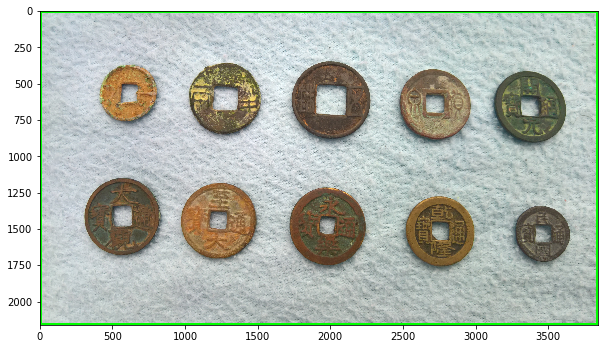

In [66]:
# Remove the inner contours
# Display the result
###
### YOUR CODE HERE
###


What do you think went wrong? As we can see, the outer box was detected as a contour and with respect to it, all other contours are internal and that's why they were not detected. How do we remove that? Let's see if we can use area of contours here.

In [209]:
# Print area and perimeter of all contours
###
### YOUR CODE HERE
###
area_list = []
for index,cnt in enumerate(contours):
    area = cv2.contourArea(cnt)
    area_list.append(area)
    perimeter = cv2.arcLength(cnt,True)
    print('Contour #',str(index+1),' has area = ',area,' and perimeter = ',perimeter)


Contour # 1  has area =  127033.0  and perimeter =  1368.136206626892
Contour # 2  has area =  199908.0  and perimeter =  1701.8418312072754
Contour # 3  has area =  235831.0  and perimeter =  1846.895653963089
Contour # 4  has area =  223876.5  and perimeter =  1795.5403155088425
Contour # 5  has area =  228531.0  and perimeter =  1821.0377893447876
Contour # 6  has area =  19373.0  and perimeter =  538.1320307254791
Contour # 7  has area =  32730.0  and perimeter =  700.4163014888763
Contour # 8  has area =  208523.5  and perimeter =  1737.883461356163
Contour # 9  has area =  199759.0  and perimeter =  1697.5575604438782
Contour # 10  has area =  125537.5  and perimeter =  1367.4082847833633
Contour # 11  has area =  192419.5  and perimeter =  1694.1433469057083
Contour # 12  has area =  238469.5  and perimeter =  1852.4520028829575
Contour # 13  has area =  8288401.0  and perimeter =  11996.0


In [210]:
# Print maximum area of contour
# This will be the box that we want to remove
###
### YOUR CODE HERE
###
print('Maximum area of contour = ',np.max(np.array(area_list)))

Maximum area of contour =  8288401.0


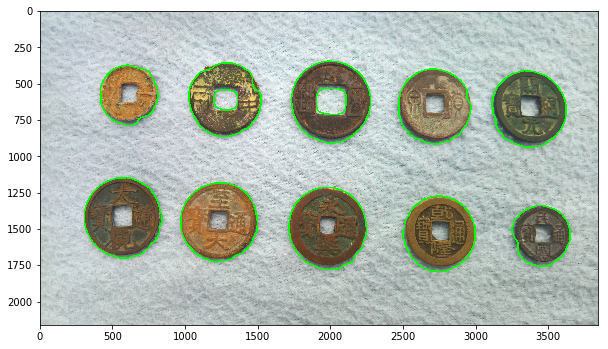

In [214]:
# Remove this contour and plot others
###
### YOUR CODE HERE
###
inner_contours = contours.copy()
inner_contours.pop(np.argmax(np.array(area_list)));
innercontourimage = imageCopy.copy()
cv2.drawContours(innercontourimage,inner_contours,-1,(0,255,0),10);
plt.imshow(innercontourimage[:,:,::-1]);

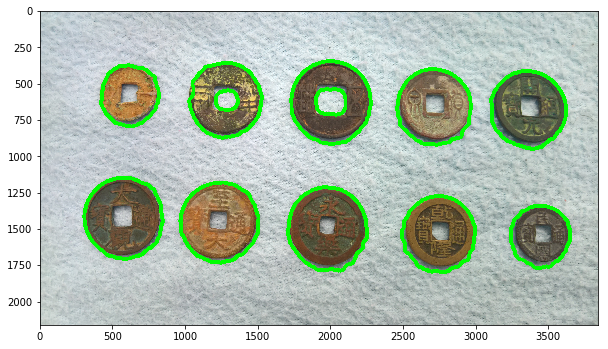

In [69]:
# Remove this contour and plot others
###
### YOUR CODE HERE
###


Now, we have to remove the internal contours. Again here we can use area or perimeter.

In [187]:
# Print maximum area of contour
# This will be the box that we want to remove
###
### YOUR CODE HERE
###
print('Sorted area of contour = ',sorted(area_list))

Sorted area of contour =  [19373.0, 32730.0, 125537.5, 127033.0, 192419.5, 199759.0, 199908.0, 208523.5, 223876.5, 228531.0, 235831.0, 238469.5, 8288401.0]


In [70]:
# Print sorted area of contours
###
### YOUR CODE HERE
###


16605.5
30872.0
130007.0
135398.0
197785.0
203535.5
207230.0
213446.5
229459.0
235121.5
242100.5
243313.0
8288401.0


We can clearly see the jump from 2nd area to 3rd. These are the 2 inner contours.

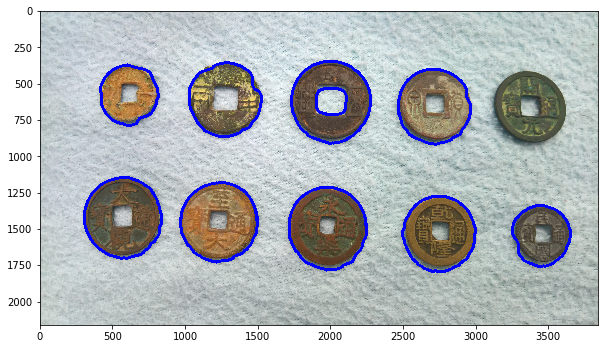

In [215]:
# Remove this contour and plot others
###
### YOUR CODE HERE
###
inner_contours = inner_contours.copy()
for i in np.argsort(area_list)[:2]:
    inner_contours.pop(i);
innercontourimage = imageCopy.copy()
cv2.drawContours(innercontourimage,inner_contours,-1,(255,0,0),20);
plt.imshow(innercontourimage[:,:,::-1]);

Number of contours = 10


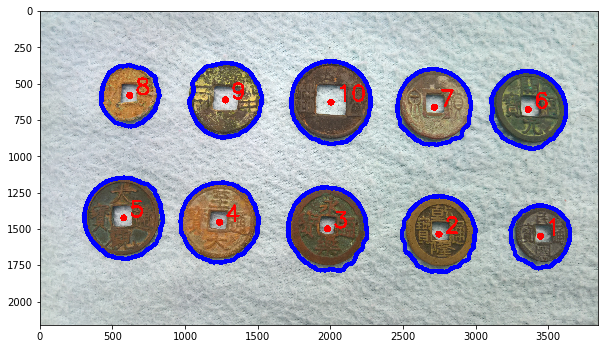

In [71]:
# Remove the 2 inner contours
# Plot the rest of them
###
### YOUR CODE HERE
###


Number of coins detected = 10


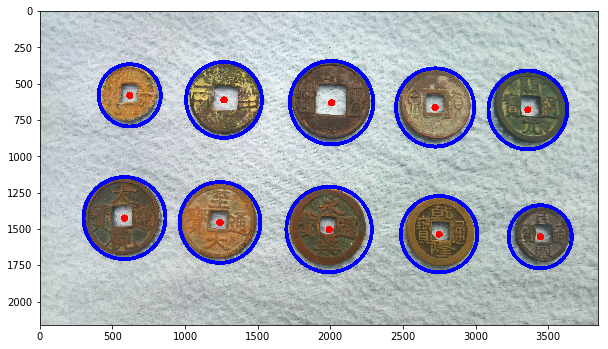

In [72]:
# Fit circles on coins
###
### YOUR CODE HERE
###
